In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(12311, 512, 512, 1)

In [4]:
images.nbytes

12909019136

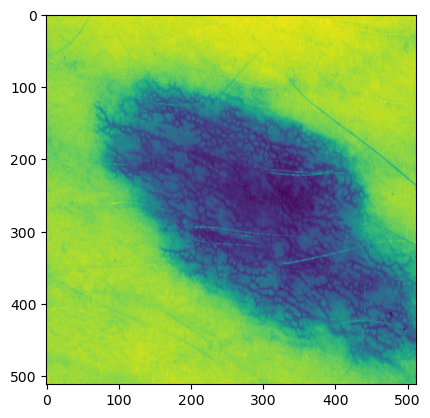

In [5]:
imshow(images[3])

In [6]:
masks.shape

(12311, 512, 512, 1)

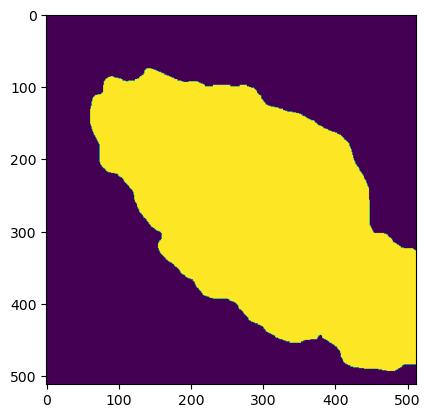

In [7]:
imshow(masks[3])

In [8]:
import sys
sys.path.append('../')
import gp2
from runner import Runner

In [9]:
from keras import losses

In [10]:
loss_fx = losses.BCE

In [11]:
R = Runner(verbose=True)

*** GP2 ***
Working directory: /tmp/tmpc3ybvie3GP2
Verbose mode active!


In [12]:
C = gp2.KUC_UNet2D(loss=loss_fx, workingdir=R.workingdir)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpc3ybvie3GP2


In [13]:
R.run(images, masks, runs=5)

Weights OK!
******
Loop 1
Epoch 1/100
10/10 [==============================] - 38s 3s/step - loss: 1.1243 - dice_coeff: 0.4308 - val_loss: 1.3202 - val_dice_coeff: 0.3628
Epoch 2/100
10/10 [==============================] - 14s 1s/step - loss: 0.9229 - dice_coeff: 0.5186 - val_loss: 1.3184 - val_dice_coeff: 0.3609
Epoch 3/100
10/10 [==============================] - 14s 1s/step - loss: 0.8579 - dice_coeff: 0.5482 - val_loss: 1.3162 - val_dice_coeff: 0.3590
Epoch 4/100
10/10 [==============================] - 15s 2s/step - loss: 0.8040 - dice_coeff: 0.5744 - val_loss: 1.3128 - val_dice_coeff: 0.3575
Epoch 5/100
10/10 [==============================] - 14s 1s/step - loss: 0.7544 - dice_coeff: 0.6005 - val_loss: 1.3104 - val_dice_coeff: 0.3561
Epoch 6/100
10/10 [==============================] - 14s 1s/step - loss: 0.7225 - dice_coeff: 0.6170 - val_loss: 1.3081 - val_dice_coeff: 0.3543
Epoch 7/100
10/10 [==============================] - 14s 2s/step - loss: 0.6818 - dice_coeff: 0.6368 - v

14/14 [==============================] - 18s 1s/step - loss: 0.3418 - dice_coeff: 0.8092 - val_loss: 0.5674 - val_dice_coeff: 0.7139
Epoch 3/100
14/14 [==============================] - 18s 1s/step - loss: 0.3324 - dice_coeff: 0.8130 - val_loss: 0.5608 - val_dice_coeff: 0.7155
Epoch 4/100
14/14 [==============================] - 18s 1s/step - loss: 0.3291 - dice_coeff: 0.8162 - val_loss: 0.5429 - val_dice_coeff: 0.7424
Epoch 5/100
14/14 [==============================] - 18s 1s/step - loss: 0.3162 - dice_coeff: 0.8193 - val_loss: 0.6051 - val_dice_coeff: 0.7086
Epoch 6/100
14/14 [==============================] - 18s 1s/step - loss: 0.3103 - dice_coeff: 0.8227 - val_loss: 0.5123 - val_dice_coeff: 0.7397
Epoch 7/100
14/14 [==============================] - 18s 1s/step - loss: 0.3091 - dice_coeff: 0.8259 - val_loss: 0.5459 - val_dice_coeff: 0.7374
Epoch 8/100
14/14 [==============================] - 18s 1s/step - loss: 0.3104 - dice_coeff: 0.8267 - val_loss: 0.5633 - val_dice_coeff: 0.72

In [14]:
R.classifier_scores

[[1.191402554512024, 0.39695197343826294],
 [0.8227540850639343, 0.5960920453071594],
 [0.5548285245895386, 0.7397671937942505],
 [0.6470446586608887, 0.7344135642051697],
 [0.5738905072212219, 0.783423900604248]]

In [15]:
R.discriminator_scores

[[0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0]]

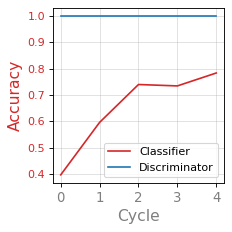

In [16]:
R.plot()

In [17]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

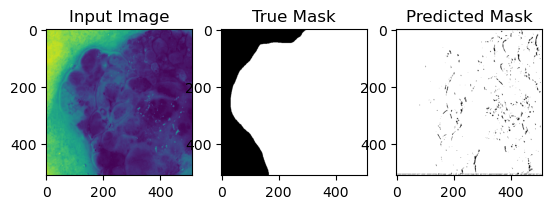

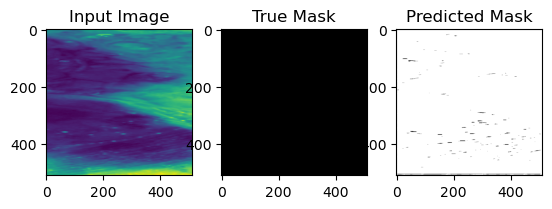

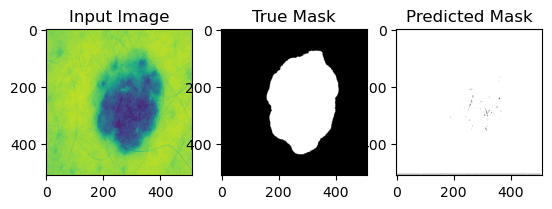

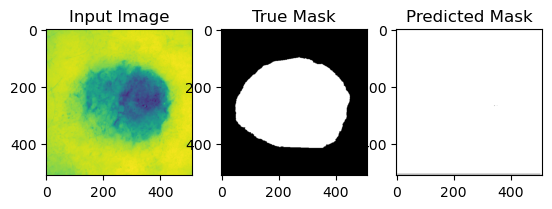

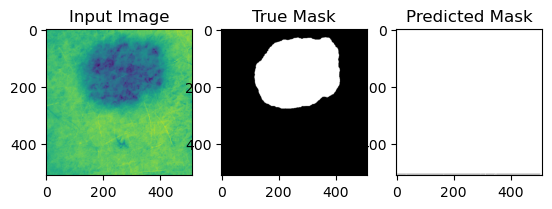

...

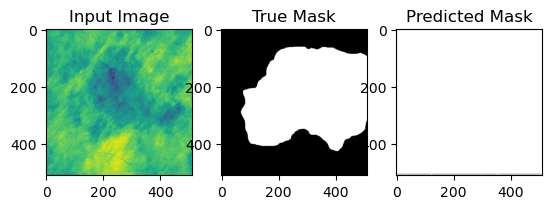

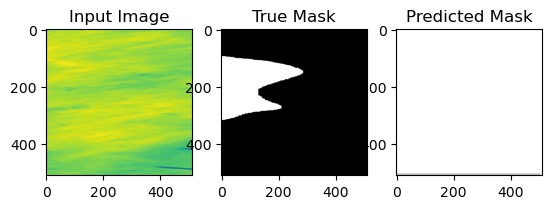

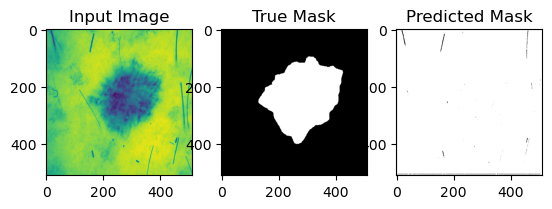

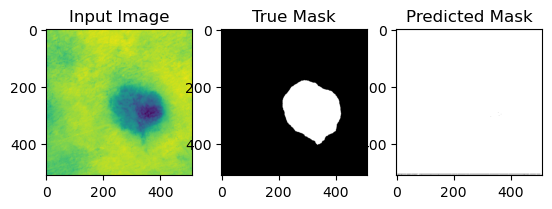

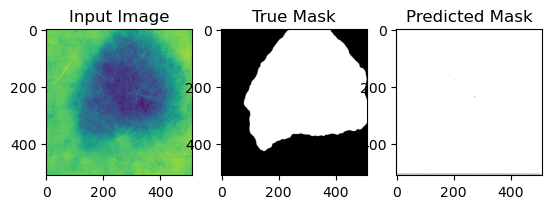

In [18]:
visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)